# DIW analysis and preprocessing




# Annotation processing
First it's neccesary to process the annotations data from the .csv

In [ ]:
import pandas as pd
import re

file_path = '/Users/ismas/Downloads/DIW/Annotations/DIW_test.csv'
# file_path = '/Users/ismas/Downloads/DIW/Annotations/DIW_train_val.csv'

# Read the original CSV file into a list of lines
with open(file_path, 'r') as file:
    lines = file.readlines()

# Process and format the lines to match the desired format
data = []
for i, line in enumerate(lines):
    match = re.search(r'\./DIW_test/.*\.thumb', line)
    if match:
        filename = match.group()[11:]
        values = lines[i + 1].strip().split(",")
        data.append([filename] + values)

# Create a new DataFrame
df = pd.DataFrame(data, columns=['filename','y_A', 'x_A', 'y_B', 'x_B', 'ordinal', 'width', 'height'])
df['x_A'] = df['x_A'].astype(int)
df['y_A'] = df['y_A'].astype(int)
df['x_B'] = df['x_B'].astype(int)
df['y_B'] = df['y_B'].astype(int)
df['width'] = df['width'].astype(int)
df['height'] = df['height'].astype(int)

# Save the DataFrame to a new CSV file
df.to_csv('test.csv', index=False)

# Print the DataFrame
df

,filename,y_A,x_A,y_B,x_B,ordinal,width,height
0,ad956b51882fce447aa5a5bb65e434366cb41aa1.thumb,118,70,257,291,>,500,333
1,279e13840daf49f037c7d687974c8e81a49576ff.thumb,54,128,352,153,>,500,375
2,ae4716af44f89f63fb61c663cc9d20d515a0972b.thumb,339,219,339,282,>,500,375
3,35fc979e2003902d7f23f222b60a6f6b989873fd.thumb,283,487,80,466,<,500,333
4,13d5b345c291d0d717d56e3e9274be715e5496a2.thumb,292,246,79,9,<,500,333
...,...,...,...,...,...,...,...,...
74436,01278a85da7bc6c9e542aa1d6e3a9ae2e4e5cb9f.thumb,73,139,73,362,>,500,302
74437,0b21d801eac16b5fdedf23f3ceddecdc4b4825fa.thumb,82,235,82,266,<,500,334
74438,adbe2888ccb08c16a34774c98bf0a7fa2986b788.thumb,239,94,56,119,<,500,333
74439,a170c2733a398afe5208915738be686d91a1e5f2.thumb,69,139,192,365,>,500,375


,filename,y_A,x_A,y_B,x_B,ordinal,width,height
51265,f246616e2a6afa9bd1decb0f6b19865f893b21b6.thumb,119,99,119,402,>,500,445
29197,593d54d96d4e1f1a2fae233354df19f83b5a4da3.thumb,53,201,53,300,>,500,334
34084,3b7623ce598d96a2d36c92e5997cd7b1f7e9b625.thumb,283,4,283,497,>,500,375
7755,f7691c5819fe1d363ab1d4f78146021ad66a73b4.thumb,107,191,307,173,>,500,374
61336,72068c9355e8d3a5c257c23a757410e5f8a1f056.thumb,218,274,473,322,>,500,494
46786,a47351e0e6535d0eb2786476c02b7ca6fde0c960.thumb,202,87,29,259,<,500,333
46230,2fcb94574f554d41bc604abe032237117a1eb264.thumb,14,157,63,471,>,500,375
6744,c8b9b683b1f35bfef312bd11edbb8d93291ef4ba.thumb,218,15,218,486,>,500,346
31743,1ffa83e6e8a8de49e0bf6e85f2dcd5f84be29a86.thumb,25,360,192,280,<,500,375
19169,d4d89f0b53da859e032e362a440dd65884d42d42.thumb,285,160,215,300,>,500,374


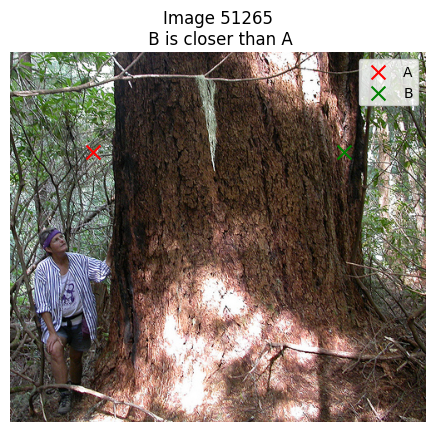

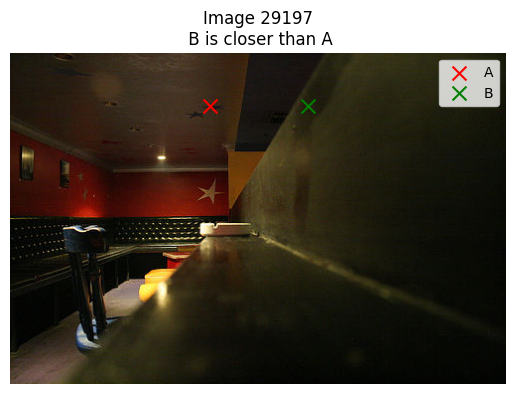

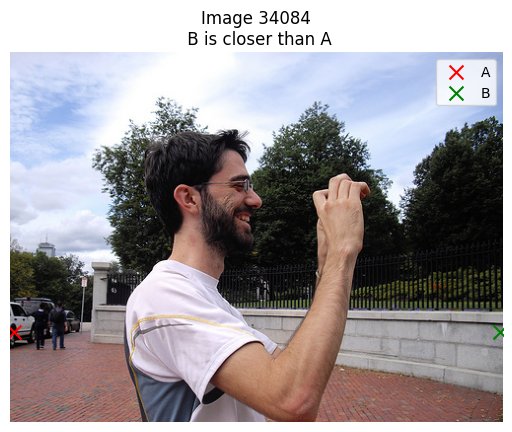

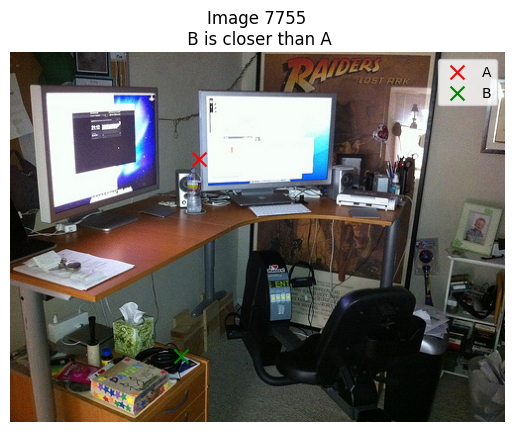

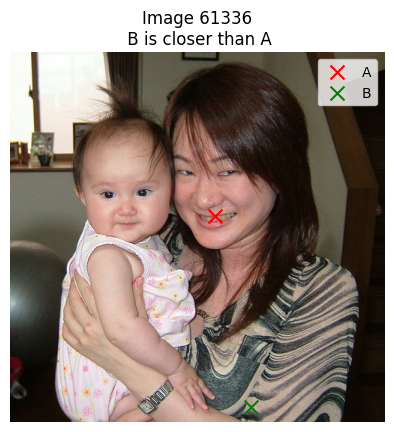

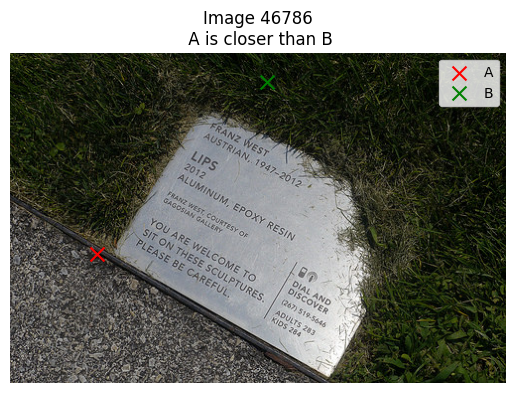

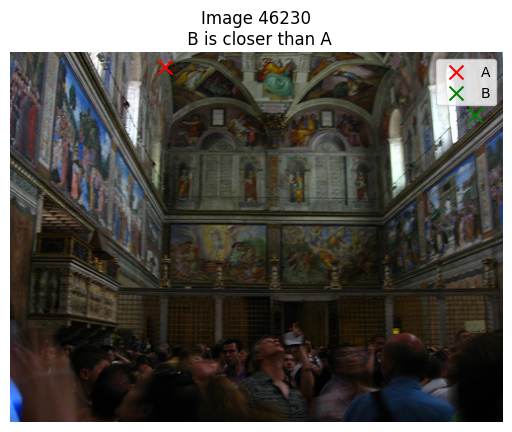

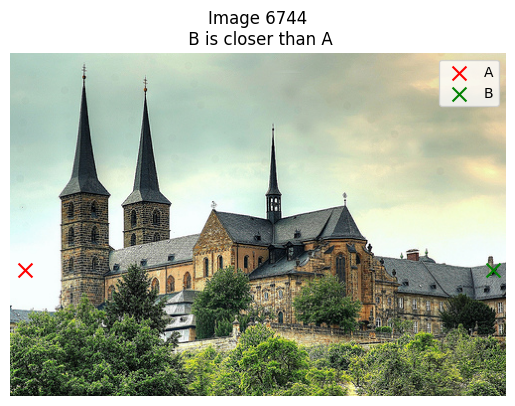

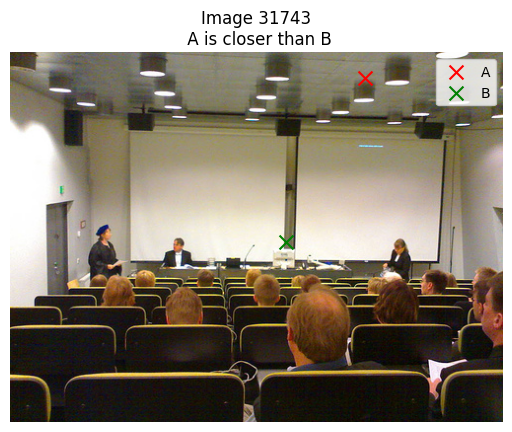

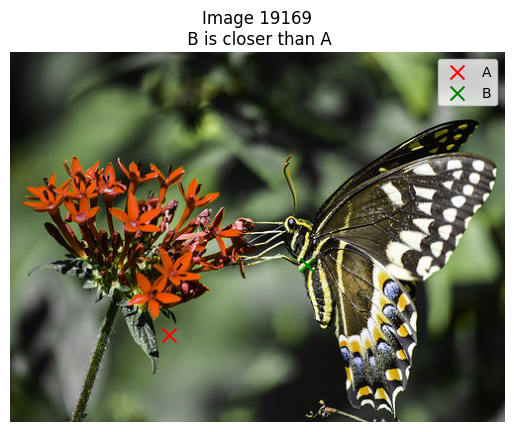

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display

# In this cell I visualize some images to check that the annotations are correct and syncronized with the images

test_path = "/Users/ismas/Downloads/DIW/test/"

samples = df.sample(10)
display(samples)

for index, sample in samples.iterrows():
    
    path = test_path + sample['filename'] # image path
    ya, xa, yb, xb, ordinal = sample['y_A'], sample['x_A'], sample['y_B'], sample['x_B'], sample['ordinal'] # annotations
    
    image = Image.open(path)
    img = np.array(image)

    # Depth relation
    if ordinal == '>':
        text = "B is closer than A"
    else:
        text = "A is closer than B"

    plt.imshow(img)
    plt.scatter(xa, ya, color="red", marker='x', s=100, label='A')
    plt.scatter(xb, yb, color="green", marker='x', s=100, label='B')
    plt.title("Image " + str(index) + "\n " + text)
    plt.legend()
    plt.axis("off")
    plt.show()

# Data analysis

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
import os

In [2]:
train_images_path = "/Users/ismas/Downloads/DIW/train_val/"
test_images_path = "/Users/ismas/Downloads/DIW/test/"

df_train = pd.read_csv("train_val.csv")
df_test = pd.read_csv("test.csv")

# images = os.listdir(test_images_path)
# images
# img = np.array(Image.open(test_images_path + images[0]))
# img.shape

(375, 500, 3)

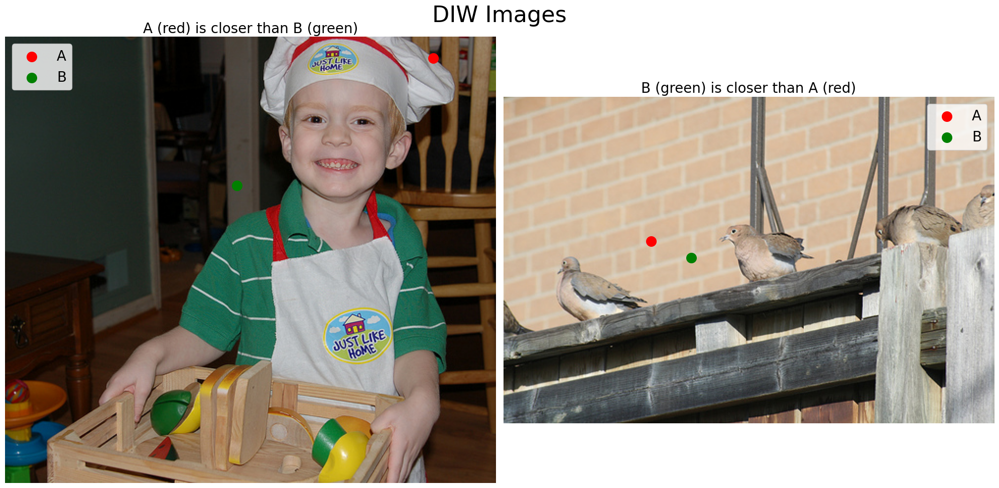

In [15]:
from IPython.display import display

test_path = "/Users/ismas/Downloads/DIW/test/"

samples = df_test.sample(10, random_state=16)
# samples = df_test.iloc[:10,:]
# display(samples)

n_cols = 2
# Set up the subplot grid
fig, axs = plt.subplots(1, n_cols, figsize=(20, 10))
i = 0

for index, sample in samples.iterrows():
    
    path = test_path + sample['filename']
    ya, xa, yb, xb, ordinal = sample['y_A'], sample['x_A'], sample['y_B'], sample['x_B'], sample['ordinal']
    
    image = Image.open(path)
    img = np.array(image)

    if ordinal == '>':
        text = "B (green) is closer than A (red)"
    else:
        text = "A (red) is closer than B (green)"
    axs[i].imshow(img)
    axs[i].scatter(xa, ya, color="red", marker='o', s=200, label='A')
    axs[i].scatter(xb, yb, color="green", marker='o', s=200, label='B')
    axs[i].set_title(text, fontsize=20)
    axs[i].legend(fontsize=20)
    axs[i].axis("off")
    i +=1
    if i== n_cols:
        break

# Adding a title to the figure
plt.suptitle("DIW Images", fontsize=32)

# Adjust layout to prevent clipping of subplots
plt.tight_layout()

# Show the plot
plt.show()

# Distribution of the resolutions

Different heights:  318
Different widths:  198
Different dims:  1111


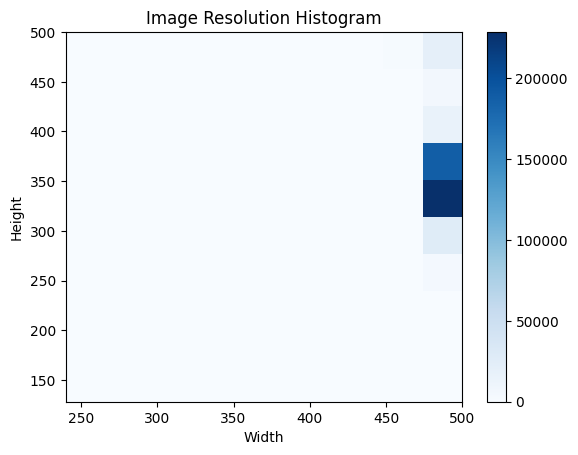

In [3]:
# In this cell I visualize the distribution of the different resolutions present in the dataset

heights = np.concatenate([df_train['height'].values, df_test['height'].values])
widths = np.concatenate([df_train['width'].values, df_test['width'].values])

dims = [d for d in zip(heights, widths)]
print("Different heights: ", len(set(heights)))
print("Different widths: ", len(set(widths)))
print("Different dims: ", len(set(dims)))


plt.hist2d(widths, heights, bins=(10, 10), cmap='Blues')
plt.xlabel('Width')
plt.ylabel('Height')
plt.title('Image Resolution Histogram')
plt.colorbar()

plt.show()

In [4]:
# Most common dimensions
from collections import Counter

dims_sorted = sorted(Counter(dims).items(), key = lambda x: (-x[1], x[0]))
for element, count in dims_sorted[:10]:
    print(f"{element}: {count}")

(375, 500): 155218
(333, 500): 138412
(334, 500): 24252
(332, 500): 23415
(500, 500): 12728
(281, 500): 10785
(331, 500): 9541
(335, 500): 6272
(374, 500): 4692
(400, 500): 4482


# Resize and save the images

Once chosen the resolution to be used, all the images will be resized to that dimension and the coordinates of the annotations will be transformed

In [4]:
def plot_img(img, row, legend = True, id = None):
    """
    This function plots an image with the depth relation information
    """

    ya, xa, yb, xb, ordinal = row['y_A'], row['x_A'], row['y_B'], row['x_B'], row['ordinal']
    if ordinal == '>':
        text = "B is closer than A"
    else:
        text = "A is closer than B"
    
    plt.imshow(img)
    plt.scatter(xa, ya, color="red", marker='x', s=100, label='A')
    plt.scatter(xb, yb, color="green", marker='x', s=100, label='B')
    
    plt.title("Image " + str(id) + "\n " + text)
    if legend:
        plt.legend()
    plt.axis("off")
    plt.show()

def translate_coordinates(original_size, resized_size, coordinates):
    """
    This function translate the **coordinates** in **original_size** to **resized_size**
    """
    W_orig, H_orig = original_size
    W_resized, H_resized = resized_size
    x_orig, y_orig = coordinates

    x_resized = (x_orig / W_orig) * W_resized
    y_resized = (y_orig / H_orig) * H_resized

    return min(int(x_resized), W_resized - 1), min(int(y_resized), H_resized - 1)

In [5]:
df_test.describe()

,y_A,x_A,y_B,x_B,width,height
count,74441.000000,74441.000000,74441.000000,74441.000000,74441.000000,74441.000000
mean,181.665762,186.570935,181.589111,312.828871,499.410070,356.951344
std,102.371281,130.647496,102.161513,131.289206,7.427602,42.560466
min,1.000000,1.000000,1.000000,1.000000,240.000000,166.000000
25%,97.000000,83.000000,97.000000,241.000000,500.000000,333.000000
50%,181.000000,161.000000,181.000000,338.000000,500.000000,336.000000
75%,263.000000,258.000000,263.000000,417.000000,500.000000,375.000000
max,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000


In [7]:
# In this cell all images from images_path will be resized to the chosen resolution
# A new dataset df_REsized will be created with the transformed coordinates
width, height = 200, 200
images_path = test_images_path
df = df_test.copy()
df_resized = pd.DataFrame(columns=["filename", "x_a", "y_a", "x_b", "y_b", "ordinal", "width", "height"])
save_name = "test_" + str(width) + "_" + str(height) 

save_path = "/Users/ismas/Downloads/DIW/" + save_name + "/"
# save_path = "/Users/ismas/Downloads/DIW/try/"

if not os.path.exists(save_path):
    os.mkdir(save_path)
z = 0
for i, row in df.iterrows():

    if i % 10000 == 0 and i !=0: # Visualizing progress
        print(i)
        # break

    # Extracting the image
    path = images_path + row['filename']
    img = np.array(Image.open(path))
    # plot_img(img, row)

    # Resizing the image
    resized = cv2.resize(img, (width,height))
    
    if resized.shape != (width, height, 3): # Some images are in black and white, they are discarded
        z += 1
        continue

    # Computing new coordinates
    x_a, y_a = translate_coordinates((row['width'], row['height']), (width, height), (row['x_A'], row['y_A']))
    x_b, y_b = translate_coordinates((row['width'], row['height']), (width, height), (row['x_B'], row['y_B']))
    
    # Adding the annotations to the new dataframe
    new_row = [row['filename'][:-6] + ".jpg", x_a, y_a, x_b, y_b, row['ordinal'], width, height]
    df_resized.loc[len(df_resized)]  = new_row

    # Saving the resized image
    cv2.imwrite(save_path + row['filename'][:-6] + ".jpg", resized)
    # np.save(save_path + row['filename'][:-6] + ".npy", resized)

    # # Plotting the image
    # print("Image shape: ", img.shape)
    # print("Original A: ", row['x_A'], row['y_A'])
    # print("Resized A : ", resized_row['x_A'], resized_row['y_A'])
    # plot_img(resized, resized_row)


# Replacing the sybols with numbers for an easier treatment
df_resized = df_resized.replace("<", 1) # A is closer
df_resized = df_resized.replace(">", -1) # B is closer

# Saving the dataframe
# df_resized.to_csv(save_name + ".csv")

print("Discarded images: ", z)
df_resized.shape

10000
20000
30000
40000
50000
60000
70000
Discarded images:  54


(74387, 8)

In [8]:
df_resized.describe()

,x_a,y_a,x_b,y_b,ordinal,width,height
count,74387.000000,74387.000000,74387.000000,74387.000000,74387.000000,74387.0,74387.0
mean,74.309799,101.326737,124.869050,101.287147,0.000686,200.0,200.0
std,52.304548,55.689225,52.538601,55.582551,1.000006,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,-1.000000,200.0,200.0
25%,33.000000,54.000000,96.000000,55.000000,-1.000000,200.0,200.0
50%,64.000000,102.000000,135.000000,102.000000,1.000000,200.0,200.0
75%,103.000000,148.000000,166.000000,148.000000,1.000000,200.0,200.0
max,199.000000,199.000000,199.000000,199.000000,1.000000,200.0,200.0


,filename,x_a,y_a,x_b,y_b,ordinal,width,height
0,ad956b51882fce447aa5a5bb65e434366cb41aa1.jpg,28,70,116,154,-1,200,200
1,279e13840daf49f037c7d687974c8e81a49576ff.jpg,51,28,61,187,-1,200,200
2,ae4716af44f89f63fb61c663cc9d20d515a0972b.jpg,87,180,112,180,-1,200,200
3,35fc979e2003902d7f23f222b60a6f6b989873fd.jpg,194,169,186,48,1,200,200
4,13d5b345c291d0d717d56e3e9274be715e5496a2.jpg,98,175,3,47,1,200,200
5,b3170c6b77fa450e96f921ae72c1a359d1900909.jpg,117,141,102,121,1,200,200
6,dcdc3f585db4152662a7f268b69a3ff140fa3dbd.jpg,52,85,62,147,-1,200,200
7,4c28df0e5e2e72baccb855298952499a51df9731.jpg,163,165,58,6,1,200,200
8,0cbb9b79f3a3fe6d1a43ffc5ce559c3212ece89e.jpg,87,15,113,15,-1,200,200
9,7617b81cf2f33012e31cd630136858d0b56fc98f.jpg,29,110,72,133,-1,200,200


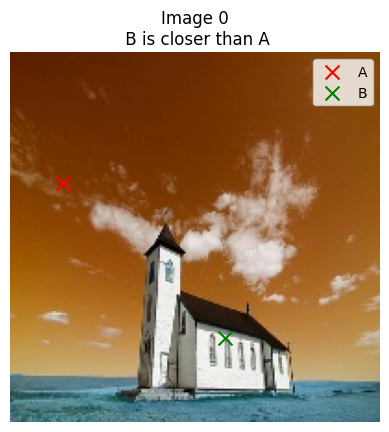

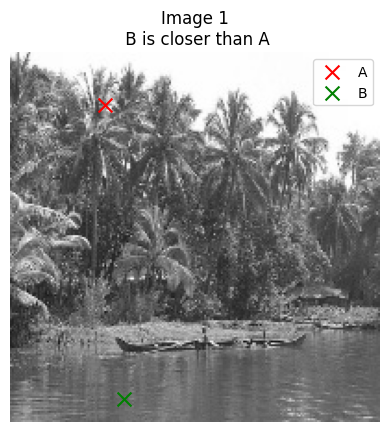

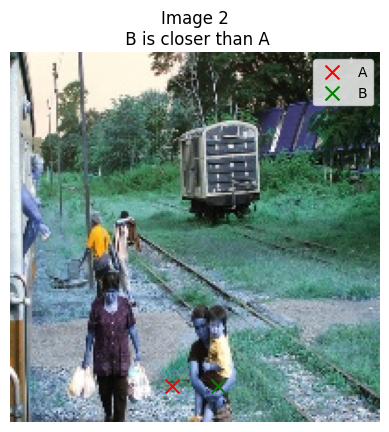

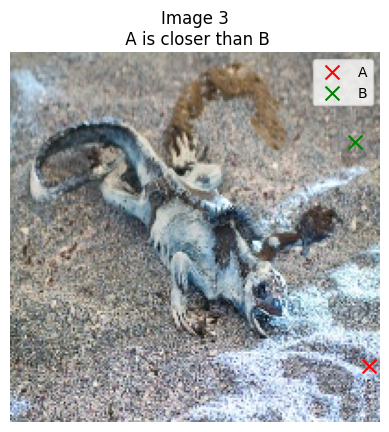

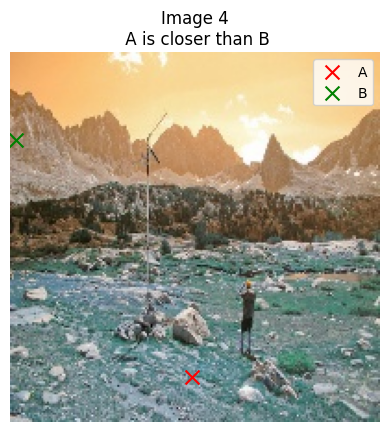

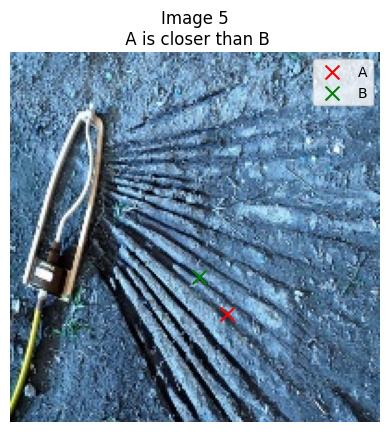

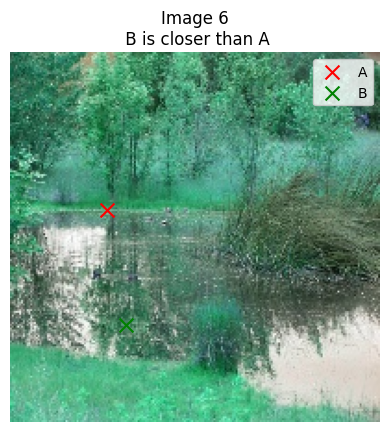

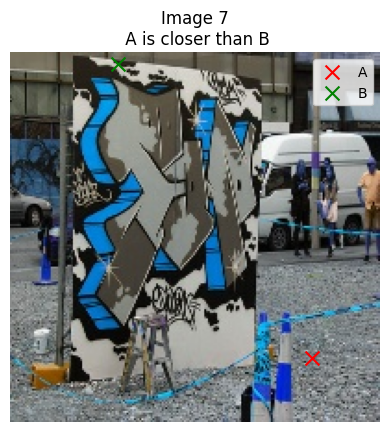

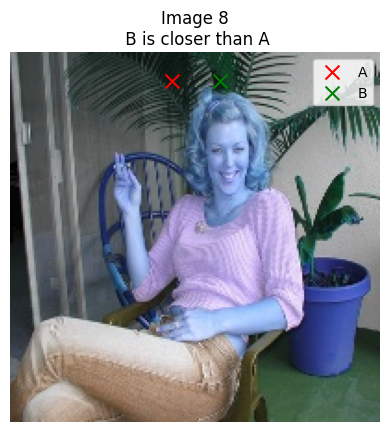

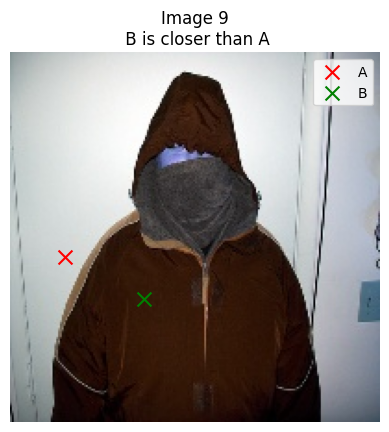

In [9]:
# In this cell again I show some images to check if the coordinate translation is working
# The RGB color code is interpreted as BGR but the coordinates and the depth relations are working good
img_path = "/Users/ismas/Downloads/DIW/test_200_200/"

samples = df_resized.sample(10, random_state=16)
samples = df_resized.iloc[:10,:]
display(samples)

for index, sample in samples.iterrows():
    
    path = img_path + sample['filename']
    ya, xa, yb, xb, ordinal = sample['y_a'], sample['x_a'], sample['y_b'], sample['x_b'], sample['ordinal']
    
    image = Image.open(path)
    img = np.array(image)

    if ordinal == -1:
        text = "B is closer than A"
    else:
        text = "A is closer than B"
    plt.imshow(img)
    plt.scatter(xa, ya, color="red", marker='x', s=100, label='A')
    plt.scatter(xb, yb, color="green", marker='x', s=100, label='B')
    plt.title("Image " + str(index) + "\n " + text)
    plt.legend()
    plt.axis("off")
    plt.show()

# Duplicated images

There are some images that contain few pairs of points because when the dataset was made some images were extracted 2 times.
In this project, for simplicity purposes, only one pair of points per image will be kept.

In [ ]:
df[df['filename'] == "00246ae9ac46b6c58388df42ea97a3734617006b.thumb"]

,filename,y_A,x_A,y_B,x_B,ordinal
8145,00246ae9ac46b6c58388df42ea97a3734617006b.thumb,112,487,357,219,>
59159,00246ae9ac46b6c58388df42ea97a3734617006b.thumb,331,16,331,485,>


In [ ]:
# for i, row in df_resized.iterrows():
images = os.listdir(save_path)
# Identify duplicate rows based on specific columns
duplicate_rows_subset = df_resized[df_resized.duplicated(subset=['filename'])]

# Display the duplicate rows based on 'Column1'
print("Duplicate Rows:")
duplicate_rows_subset.sort_values(by=duplicate_rows_subset.columns[0], ascending=True)

Duplicate Rows:


,filename,y_A,x_A,y_B,x_B,ordinal
59119,00246ae9ac46b6c58388df42ea97a3734617006b.npy,6,194,176,176,-1
49970,01a06d32182e4f7f9eacd10a43bc92f69b0032c4.npy,128,111,38,69,-1
64104,01a78819ffa9efbb032d7351d9983b5e46fc052f.npy,41,158,93,93,1
62937,0298afcca668cd47cac95a9f72cb2078255df4b8.npy,12,188,142,142,-1
33838,0333733d485839d3c1b0e814433e8b1f1aaf355f.npy,132,49,33,189,-1
...,...,...,...,...,...,...
47901,fc6f4bbf9fb497a7b356e9c247f8c69111bce35b.npy,12,188,157,157,1
52919,fd60c6caf00c0fde120c21cbcce200fee5f674a8.npy,56,144,158,158,1
60691,fe07e42eaf32e5ae85a9e82492045c4136ac7fb9.npy,160,46,147,181,-1
52670,fec10d32e3cf7a3c20f9b4c78a0bb96a84925072.npy,97,96,79,117,-1


In [7]:
import pandas as pd
df = pd.read_csv("train_val.csv")
df

,filename,y_A,x_A,y_B,x_B,ordinal,width,height
0,_val/dc4b5a857a519b705dafb01354765e1714959a11....,88,54,88,447,<,500,375
1,_val/938e874868c95126641b298c87c60287e85e3dbb....,183,115,300,72,>,500,315
2,_val/b1d4dad63d1672ff02ea73f8e70d4537d0b08e40....,101,128,245,134,>,500,333
3,_val/45845be96db8efd8ad3ea0f5cae444816aeda0b7....,278,265,327,357,>,500,375
4,_val/b9ba2270e995f16942bc0050154c199ed9896a5f....,276,21,276,480,>,500,334
...,...,...,...,...,...,...,...,...
420767,_val/aefeea81994a226b6f4bbd7fb1dfc35f7e2df138....,51,285,281,93,>,500,358
420768,_val/0b4c6dade9104fbd9fb15ff95abb1863f8973d8c....,240,307,133,149,>,500,349
420769,_val/0f5b583d6a8c1401ebcd667640f83c1f4098650d....,295,156,67,63,<,500,333
420770,_val/7b08fbe7b9057af061fd664f8d06cd149aa36068....,13,12,13,489,<,500,281


In [8]:
# Identify duplicate rows based on specific columns
duplicate_rows_subset = df[df.duplicated(subset=['filename'])]

# Display the duplicate rows based on 'Column1'
print("Duplicate Rows:")
duplicate_rows_subset.sort_values(by=duplicate_rows_subset.columns[0], ascending=True)

Duplicate Rows:


,filename,y_A,x_A,y_B,x_B,ordinal,width,height
194368,_val/0000d8509cbfa3caf30dba6aa0c737ed36295e10....,161,87,161,414,<,500,333
231539,_val/0000d8509cbfa3caf30dba6aa0c737ed36295e10....,177,75,177,426,<,500,333
398456,_val/000254eaf2da8eebf917d9ac208da66c8c3c9a1b....,106,114,106,387,<,500,333
110617,_val/000270a4d566412b52f8917d4b7c7bce1aa75971....,133,33,208,331,>,500,375
368325,_val/0005d909831a460fcda98e99a67b9586f5b4179c....,175,63,175,438,<,500,375
...,...,...,...,...,...,...,...,...
368474,_val/ffe1a0c2dafabdd7a7b771437dd22a6148635f69....,262,18,262,483,<,500,333
236087,_val/ffe1a0c2dafabdd7a7b771437dd22a6148635f69....,328,138,221,455,<,500,333
262088,_val/ffe2732265b9021709ae121baf20296d55bda15f....,235,71,235,430,<,500,371
231073,_val/fffbb74f1ae1ceefcdfec41352283d2a9fed3089....,275,218,275,283,<,500,397


# Sepatare test folder

In this section I divide the dataframe into train, train and test with a proportion of 0.7, 0.15, 0.15

In [10]:
# df_path = "/content/drive/MyDrive/depth_estimation/DIW/test_200_200.csv" # Colab
# df_path = "test_200_200.csv" # Local
# df = pd.read_csv(df_path).iloc[:,1:]
df = df_resized
df

,filename,x_a,y_a,x_b,y_b,ordinal,width,height
0,ad956b51882fce447aa5a5bb65e434366cb41aa1.jpg,28,70,116,154,-1,200,200
1,279e13840daf49f037c7d687974c8e81a49576ff.jpg,51,28,61,187,-1,200,200
2,ae4716af44f89f63fb61c663cc9d20d515a0972b.jpg,87,180,112,180,-1,200,200
3,35fc979e2003902d7f23f222b60a6f6b989873fd.jpg,194,169,186,48,1,200,200
4,13d5b345c291d0d717d56e3e9274be715e5496a2.jpg,98,175,3,47,1,200,200
...,...,...,...,...,...,...,...,...
74382,01278a85da7bc6c9e542aa1d6e3a9ae2e4e5cb9f.jpg,55,48,144,48,-1,200,200
74383,0b21d801eac16b5fdedf23f3ceddecdc4b4825fa.jpg,94,49,106,49,1,200,200
74384,adbe2888ccb08c16a34774c98bf0a7fa2986b788.jpg,37,143,47,33,1,200,200
74385,a170c2733a398afe5208915738be686d91a1e5f2.jpg,55,36,146,102,-1,200,200


In [11]:
import os
import random
import shutil
import pandas as pd

# Set the seed for replicability
random.seed(16)
# Set the path to the original folder
original_folder = "/Users/ismas/Downloads/DIW/test_200_200/"

# Set the paths to the train and test folders
train_folder = "/Users/ismas/Downloads/DIW/test_200_200/train/"
test_folder = "/Users/ismas/Downloads/DIW/test_200_200/test/"
val_folder = "/Users/ismas/Downloads/DIW/test_200_200/val/"

# Create the train and test folders if they don't exist
os.makedirs(train_folder, exist_ok=True)
os.makedirs(val_folder, exist_ok=True)
os.makedirs(test_folder, exist_ok=True)

# Get the list of JPG files in the original folder
jpg_files = list(set(df['filename']))

# Shuffle the list of JPG files
random.shuffle(jpg_files)

# Calculate the split index based on the 70-30 rate
split_index = int(len(jpg_files) * 0.7)

# Split the JPG files into train and test sets
train_files = jpg_files[:split_index]
test_files = jpg_files[split_index:]

# Calculate the split index based on the 15-15 rate
split_index = int(len(test_files) * 0.5)

# Split the JPG files into train and test sets
val_files = test_files[:split_index]
new_test_files = test_files[split_index:]

i = 0
# Move the train files to the train folder
for file in train_files:
    if i % 10000 == 0:
        print(i)
    i+=1 
    shutil.move(original_folder + file, train_folder + file)
i=0
# Move the val files to the val folder
for file in val_files:
    if i % 10000 == 0:
        print(i)
    i+=1
    shutil.move(original_folder + file, val_folder + file)
i=0
# Move the test files to the test folder
for file in new_test_files:
    if i % 10000 == 0:
        print(i)
    i+=1
    shutil.move(original_folder + file, test_folder + file)

0
10000
20000
30000
40000
50000
0
10000
0
10000


In [12]:
# Checking that every image has been moved correctly
print(len(train_files), len(val_files), len(new_test_files))
print(len(os.listdir(train_folder)), len(os.listdir(val_folder)), len(os.listdir(test_folder)))

51751 11089 11090


51751 11089 11090


In [13]:
# Checking for intersections, every image should be only in one partition
s1, s2, s3 = set(train_files), set(val_files), set(new_test_files)

s1.intersection(s2, s3)

set()

In [14]:
# Now that the images have been divided, it's time to divide the dataset following that division
# Build train, val and test dataframes

train_df = pd.DataFrame(columns=df.columns)
val_df = pd.DataFrame(columns=df.columns)
test_df = pd.DataFrame(columns=df.columns)

for i, row in df.iterrows():
    if i % 10000 == 0:
        print(i)
    if row['filename'] in train_files:
        train_df.loc[len(train_df)] = row
    if row['filename'] in val_files:
        val_df.loc[len(val_df)] = row
    if row['filename'] in new_test_files:
        test_df.loc[len(test_df)] = row

train_df = train_df.drop_duplicates(subset='filename')
val_df = val_df.drop_duplicates(subset='filename')
test_df = test_df.drop_duplicates(subset='filename')

train_df.shape, val_df.shape, test_df.shape

0
10000
20000
30000
40000
50000
60000
70000


((51751, 8), (11089, 8), (11090, 8))

,filename,x_a,y_a,x_b,y_b,ordinal,width,height
0,ad956b51882fce447aa5a5bb65e434366cb41aa1.jpg,28,70,116,154,-1,200,200
1,ae4716af44f89f63fb61c663cc9d20d515a0972b.jpg,87,180,112,180,-1,200,200
2,35fc979e2003902d7f23f222b60a6f6b989873fd.jpg,194,169,186,48,1,200,200
3,b3170c6b77fa450e96f921ae72c1a359d1900909.jpg,117,141,102,121,1,200,200
4,dcdc3f585db4152662a7f268b69a3ff140fa3dbd.jpg,52,85,62,147,-1,200,200
5,4c28df0e5e2e72baccb855298952499a51df9731.jpg,163,165,58,6,1,200,200
6,0cbb9b79f3a3fe6d1a43ffc5ce559c3212ece89e.jpg,87,15,113,15,-1,200,200
7,7617b81cf2f33012e31cd630136858d0b56fc98f.jpg,29,110,72,133,-1,200,200
8,ed5c1b21d3a235a9cb746506005fcb326706e33a.jpg,26,6,174,6,-1,200,200
9,3020be8d902a173ff6450bd477e60676432a2733.jpg,46,19,153,19,1,200,200


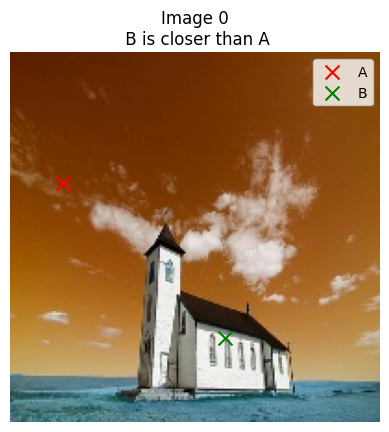

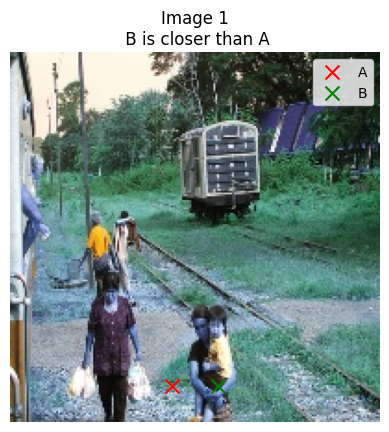

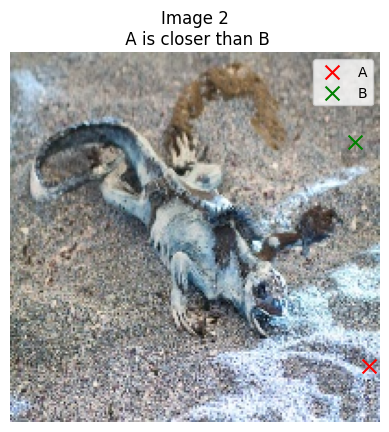

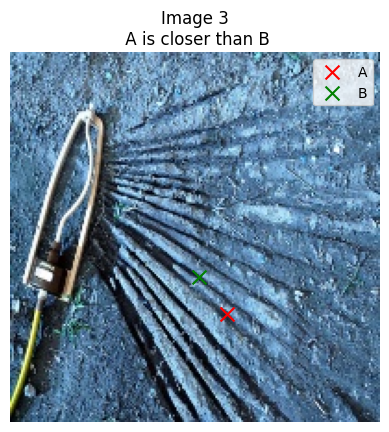

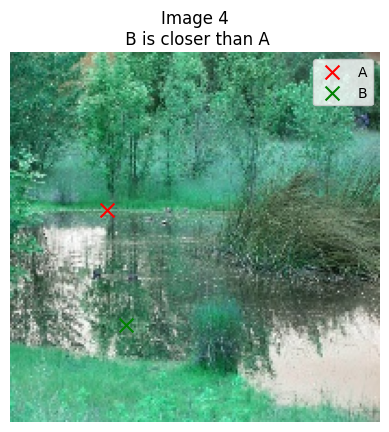

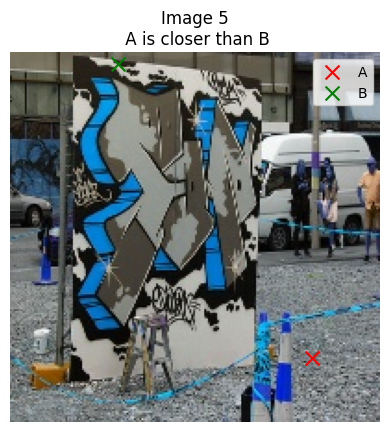

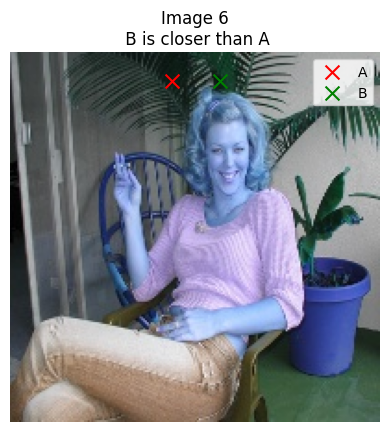

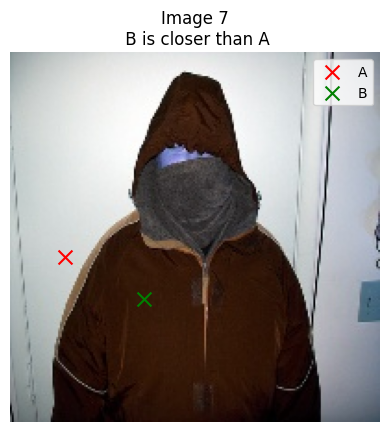

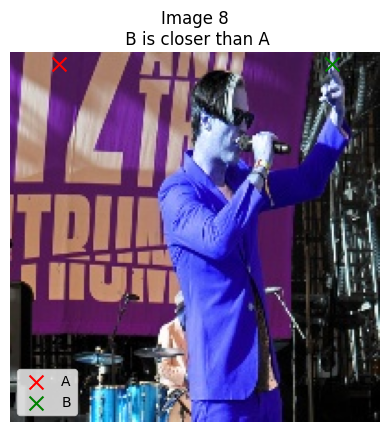

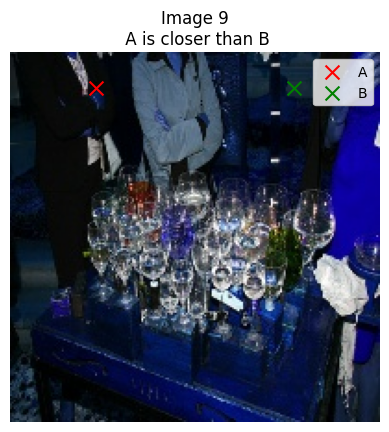

In [17]:
# Again I show some images to check that the annotations are well syncronized and thre is no mistakes

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display

test_path = "/Users/ismas/Downloads/DIW/test_200_200/train/"

samples = train_df.sample(10, random_state=16)
samples = train_df.iloc[:10,:]
display(samples)

for index, sample in samples.iterrows():
    
    path = test_path + sample['filename']
    ya, xa, yb, xb, ordinal = sample['y_a'], sample['x_a'], sample['y_b'], sample['x_b'], sample['ordinal']
    
    image = Image.open(path)
    img = np.array(image)

    if ordinal == -1:
        text = "B is closer than A"
    else:
        text = "A is closer than B"
    plt.imshow(img)
    plt.scatter(xa, ya, color="red", marker='x', s=100, label='A')
    plt.scatter(xb, yb, color="green", marker='x', s=100, label='B')
    plt.title("Image " + str(index) + "\n " + text)
    plt.legend()
    plt.axis("off")
    plt.show()

In [18]:
# Saving the datasets
folder = "/Users/ismas/Downloads/DIW/"
train_df.to_csv(folder + "df_train.csv")
val_df.to_csv(folder + "df_val.csv")
test_df.to_csv(folder + "df_test.csv")